<a href="https://colab.research.google.com/github/ajeetth/AI-Recruiter-Agency/blob/main/Multimodal_RAG_Drones.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Multimodal RAG for Drone Technology

building a RAG system that can process and understand both text and image data to answer questions about drone technology.

The program implements:

* Large Language Models (LLMs) to process and understand text about drones.
   
* Multimodal datasets containing images and labels of drones.
   
* Functions to display images and identify objects within them using bounding boxes.
   
* Builds a system that can answer questions about drone technology using both text and images.
   





In [9]:
from google.colab import userdata
api_key = userdata.get('OPENAI_KEY')
deeplake_token = userdata.get('ACTIVELOOP_TOKEN')

In [10]:
import openai
openai.api_key = api_key

In [11]:
import os
os.environ['ACTIVELOOP_TOKEN'] = deeplake_token

# Installing the environment

Run the Deep Lake installation in the following cell first.

In [4]:
!pip install llama-index-vector-stores-deeplake==0.1.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 74.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 4.3 MB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 9.1.2
    Uninstalling tenacity-9.1.2:
      Successfully uninstalled tenacity-9.1.2
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2


In [5]:
!pip install deeplake==3.9.18

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.9/608.9 kB 28.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of s3transfer to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 10.6 MB/s eta 0:00:00
   ━━━

In [1]:
!pip install llama-index==0.10.64

  Using cached llama_index-0.10.64-py3-none-any.whl.metadata (11 kB)
  Using cached llama_index_agent_openai-0.2.9-py3-none-any.whl.metadata (729 bytes)
INFO: pip is looking at multiple versions of llama-index-indices-managed-llama-cloud to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of llama-index-indices-managed-llama-cloud to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
INFO: pip is looking at multiple versions of llama-index-readers-llama-parse to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of llama-cloud-services to determine 

In [2]:
!pip install llama-index-llms-openai==0.1.29

  Attempting uninstall: llama-index-llms-openai
    Found existing installation: llama-index-llms-openai 0.1.31
    Uninstalling llama-index-llms-openai-0.1.31:
      Successfully uninstalled llama-index-llms-openai-0.1.31


In [3]:
from llama_index.core import VectorStoreIndex, SimpleDirectoryReader, Document
from llama_index.vector_stores.deeplake import DeepLakeVectorStore

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /usr/local/lib/python3.11/dist-
[nltk_data]     packages/llama_index/core/_static/nltk_cache...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
/usr/local/lib/python3.11/dist-packages/deeplake/util/check_latest_version.py:32: UserWarning: A newer version of deeplake (4.1.18) is available. It's recommended that you update to the latest version using `pip install -U deeplake`.
  warnings.warn(


In [4]:
!pip install sentence-transformers==3.0.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 69.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [5]:
# For Google Colab and Activeloop while waiting for Activeloop (April 2024) pending new version
#This line writes the string "nameserver 8.8.8.8" to the file. This is specifying that the DNS server the system
#should use is at the IP address 8.8.8.8, which is one of Google's Public DNS servers.
with open('/etc/resolv.conf', 'w') as file:
   file.write("nameserver 8.8.8.8")

# Loading the LLM dataset



In [12]:
import deeplake
dataset_path_llm = 'hub://ajithdevadiga/drone_dataV2'
ds_llm = deeplake.load(dataset_path_llm)

|

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/ajithdevadiga/drone_dataV2



/

hub://ajithdevadiga/drone_dataV2 loaded successfully.



In [13]:
import json
import pandas as pd
import numpy as np

# Create a dictionary to hold the data
data_llm = {}

# Iterate through the tensors in the dataset
for tensor_name in ds_llm.tensors:
    tensor_data = ds_llm[tensor_name].numpy()

    # Check if the tensor is multi-dimensional
    if tensor_data.ndim > 1:
        # Flatten multi-dimensional tensors
        data_llm[tensor_name] = [np.array(e).flatten().tolist() for e in tensor_data]
    else:
        # Convert 1D tensors directly to lists and decode text
        if tensor_name == "text":
            data_llm[tensor_name] = [t.tobytes().decode('utf-8') if t else "" for t in tensor_data]
        else:
            data_llm[tensor_name] = tensor_data.tolist()

# Create a Pandas DataFrame from the dictionary
df_llm = pd.DataFrame(data_llm)
df_llm

,embedding,id,metadata,text
0,"[-0.00044151395559310913, 0.01004217378795147,...",[3bbca82d-f631-4ccb-ab6a-d579e52896de],"[{'file_path': '/content/data/1804.06985.txt',...",[High Energy Physics Theory arXiv1804.06985 h...
1,"[-0.014672460965812206, 0.01782255992293358, 0...",[c7a20c5e-31e0-436e-97f2-3770a40363c1],"[{'file_path': '/content/data/2202.11983.txt',...",[Computer Science Computer Vision and Pattern...
2,"[-0.01656881347298622, 0.0006223262171261013, ...",[fc5dc2ef-b69a-4b6c-8bf3-e39c61b97980],[{'file_path': '/content/data/Computer_vision....,[Computerized information extraction from imag...
3,"[-0.003214456606656313, -0.005572826601564884,...",[78404194-cf40-4d6b-aca5-f6ded022d347],[{'file_path': '/content/data/Computer_vision....,[Researchers also realized that many of these ...
4,"[-0.02019762247800827, 0.004196865949779749, 0...",[10be25cb-e8c2-4447-b7a1-9f6e5156ddc2],[{'file_path': '/content/data/Computer_vision....,[neural net and deep learning based image and ...
...,...,...,...,...
82,"[-0.013528451323509216, -0.0009190708515234292...",[a1887dac-5a2a-49eb-9845-286725d12368],[{'file_path': '/content/data/Unmanned_aerial_...,[Unmanned Aerial Vehicles UAVs in Landslide In...
83,"[-0.007956444285809994, -0.01064729318022728, ...",[f10a6f70-286f-4bc5-a818-2eaf4e0960d8],[{'file_path': '/content/data/Unmanned_aerial_...,[ISSN 16048156 . Šálek Ondřej Matolín Milan G...
84,"[-0.010332026518881321, -0.0036802280228585005...",[f5a9bd26-fb8b-47aa-9bef-1efc9ad80b9e],[{'file_path': '/content/data/Unmanned_aerial_...,[Halon Eytan 21 December 2018. Israeli antidro...
85,"[-0.007194323930889368, -0.009332260116934776,...",[4d28dffd-862f-440a-b817-963978dda6aa],[{'file_path': '/content/data/Unmanned_aerial_...,[ISBN 9789897585555 . Heathrow picks CUAS to ...


In [14]:
# Ensure 'text' column is of type string
df_llm['text'] = df_llm['text'].astype(str)
# Create documents with IDs
documents_llm = [Document(text=row['text'], doc_id=str(row['id'])) for _, row in df_llm.iterrows()]

## Initializing the LLM Query Engine

In [15]:
from llama_index.core import VectorStoreIndex
vector_store_index_llm = VectorStoreIndex.from_documents(documents_llm)

In [16]:
vector_query_engine_llm = vector_store_index_llm.as_query_engine(similarity_top_k=2, temperature=0.1, num_output=1024)

### User input for multimodular modular RAG

Modular RAG with multiple modalities (text, images) and sources of information; in this case, two datasets.

In [17]:
user_input="How do drones identify a truck?"

In [18]:
import time
import textwrap
#start the timer
start_time = time.time()
llm_response = vector_query_engine_llm.query(user_input)
# Stop the timer
end_time = time.time()
# Calculate and print the execution time
elapsed_time = end_time - start_time
print(f"Query execution time: {elapsed_time:.4f} seconds")

print(textwrap.fill(str(llm_response), 100))

Query execution time: 1.8711 seconds
Drones can identify a truck through various methods such as using multisource remote sensing,
unmanned aerial vehicle (UAV) scanning technology, and data from unmanned aerial vehicles combined
with terrestrial laser scanning.


# Loading and visualizing the multimodal dataset



In [19]:
import deeplake

dataset_path = 'hub://activeloop/visdrone-det-train'
ds = deeplake.load(dataset_path) # Returns a Deep Lake Dataset but does not download data locally

\

Opening dataset in read-only mode as you don't have write permissions.


|

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/visdrone-det-train



/

hub://activeloop/visdrone-det-train loaded successfully.



In [20]:
ds.summary()

Dataset(path='hub://activeloop/visdrone-det-train', read_only=True, tensors=['boxes', 'images', 'labels'])

 tensor      htype                 shape               dtype  compression
 -------    -------               -------             -------  ------- 
  boxes      bbox            (6471, 1:914, 4)         float32   None   
 images      image     (6471, 360:1500, 480:2000, 3)   uint8    jpeg   
 labels   class_label          (6471, 1:914)          uint32    None   


In [21]:
ds.visualize()

HINT: Please forward the port - 33313 to your local machine, if you are running on the cloud.
 * Serving Flask app 'dataset_visualizer'
 * Debug mode: off


In [22]:
import pandas as pd

# Create an empty DataFrame with the defined structure
df = pd.DataFrame(columns=['image', 'boxes', 'labels'])

# Iterate through the samples using enumerate
for i, sample in enumerate(ds):

    # Image data (choose either path or compressed representation)
    # df.loc[i, 'image'] = sample.images.path  # Store image path
    df.loc[i, 'image'] = sample.images.tobytes()  # Store compressed image data

    # Bounding box data (as a list of lists)
    boxes_list = sample.boxes.numpy(aslist=True)
    df.loc[i, 'boxes'] = [box.tolist() for box in boxes_list]

    # Label data (as a list)
    label_data = sample.labels.data()
    df.loc[i, 'labels'] = label_data['text']

df

,image,boxes,labels
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[1221.0, 84.0, 16.0, 33.0], [1235.0, 71.0, 18...","[pedestrian, pedestrian, tricycle, pedestrian,..."
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[351.0, 936.0, 305.0, 114.0], [0.0, 818.0, 22...","[car, car, car, car, car, car, car, car, car, ..."
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[699.0, 716.0, 26.0, 54.0], [600.0, 604.0, 22...","[truck, car, van, car, car, car, car, car, car..."
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[417.0, 77.0, 57.0, 54.0], [387.0, 109.0, 31....","[ignored regions, ignored regions, car, car, c..."
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[794.0, 617.0, 97.0, 115.0], [803.0, 539.0, 7...","[car, car, car, car, car, car, car, car, car, ..."
...,...,...,...
6466,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[683.0, 710.0, 7.0, 6.0], [681.0, 717.0, 5.0,...","[car, car, car, car, awning-tricycle, car, car..."
6467,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[1761.0, 676.0, 207.0, 155.0], [1539.0, 648.0...","[car, car, car, car, car, van, car, car, car, ..."
6468,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[0.0, 501.0, 105.0, 93.0], [412.0, 594.0, 172...","[car, van, pedestrian, pedestrian, pedestrian,..."
6469,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,"[[200.0, 604.0, 112.0, 64.0], [311.0, 560.0, 1...","[van, truck, van, car, car, van, others, car, ..."


In [23]:
labels_list = ds.labels.info['class_names']
labels_list

['ignored regions',
 'pedestrian',
 'people',
 'bicycle',
 'car',
 'van',
 'truck',
 'tricycle',
 'awning-tricycle',
 'bus',
 'motor',
 'others']

# Navigating the multimodal dataset structure

## Selecting an image

In [24]:
# choose an image
ind=0
image = ds.images[ind].numpy() # Fetch the first image and return a numpy array

In [25]:
import deeplake
from IPython.display import display
from PIL import Image
import cv2  # Import OpenCV

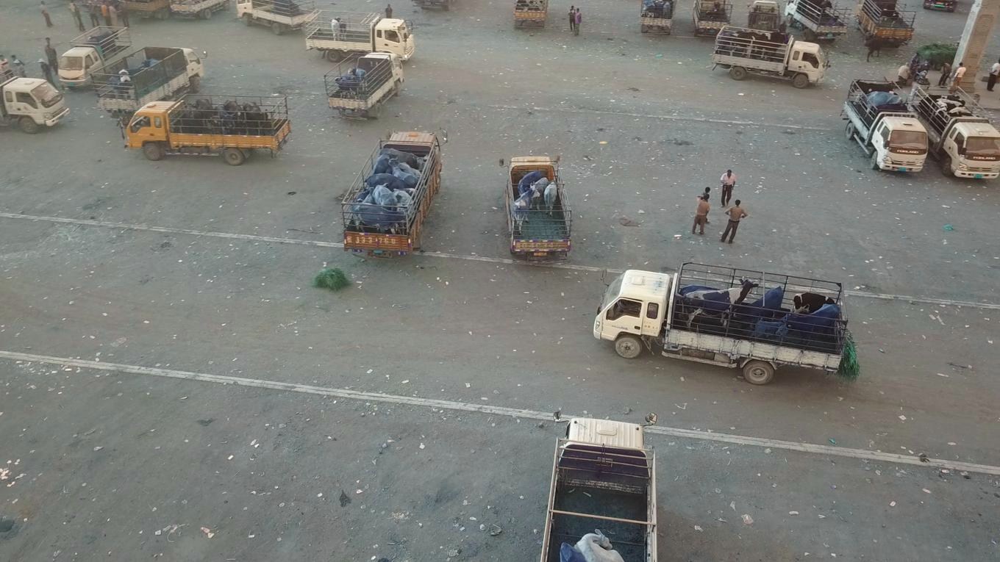

In [26]:
image = ds.images[0].numpy()

# Convert from BGR to RGB (if necessary)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Create PIL Image and display
img = Image.fromarray(image_rgb)
display(img)

## Adding Bounding boxes and saving the image

In [27]:
labels = ds.labels[ind].data() # Fetch the labels in the selected image
print(labels)

{'value': array([1, 1, 7, 1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 1, 6, 6, 6, 6,
       1, 1, 1, 1, 1, 1, 6, 6, 3, 6, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 6, 6, 6], dtype=uint32), 'text': ['pedestrian', 'pedestrian', 'tricycle', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'truck', 'pedestrian', 'truck', 'truck', 'truck', 'truck', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'bicycle', 'truck', 'truck', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'pedestrian', 'truck', 'truck', 'truck']}


In [28]:
values = labels['value']
text_labels = labels['text']

# Determine the maximum text label length for formatting
max_text_length = max(len(label) for label in text_labels)

# Print the header
print(f"{'Index':<10}{'Label':<{max_text_length + 2}}")
print("-" * (10 + max_text_length + 2))  # Add a separator line

# Print the indices and labels in two columns
for index, label in zip(values, text_labels):
    print(f"{index:<10}{label:<{max_text_length + 2}}")

Index     Label       
----------------------
1         pedestrian  
1         pedestrian  
7         tricycle    
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
6         truck       
1         pedestrian  
6         truck       
6         truck       
6         truck       
6         truck       
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
6         truck       
6         truck       
3         bicycle     
6         truck       
6         truck       
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         pedestrian  
1         p

In [29]:
 ds.labels[ind].info['class_names'] # class names of the selected image

['ignored regions',
 'pedestrian',
 'people',
 'bicycle',
 'car',
 'van',
 'truck',
 'tricycle',
 'awning-tricycle',
 'bus',
 'motor',
 'others']

In [30]:
def display_image_with_bboxes(image_data, bboxes, labels, label_name, ind=0):
    #Displays an image with bounding boxes for a specific label.

    image_bytes = io.BytesIO(image_data)
    img = Image.open(image_bytes)

    # Extract class names specifically for the selected image
    class_names = ds.labels[ind].info['class_names']

    # Filter for the specific label (or display all if class names are missing)
    if class_names is not None:
        try:
            label_index = class_names.index(label_name)
            relevant_indices = np.where(labels == label_index)[0]
        except ValueError:
            print(f"Warning: Label '{label_name}' not found. Displaying all boxes.")
            relevant_indices = range(len(labels))
    else:
        relevant_indices = []  # No labels found, so display no boxes

    # Draw bounding boxes
    draw = ImageDraw.Draw(img)
    for idx, box in enumerate(bboxes):  # Enumerate over bboxes
        if idx in relevant_indices:   # Check if this box is relevant
            x1, y1, w, h = box
            x2, y2 = x1 + w, y1 + h
            draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
            draw.text((x1, y1), label_name, fill="red")
    # Save the image
    save_path="boxed_image.jpg"
    img.save(save_path)
    display(img)


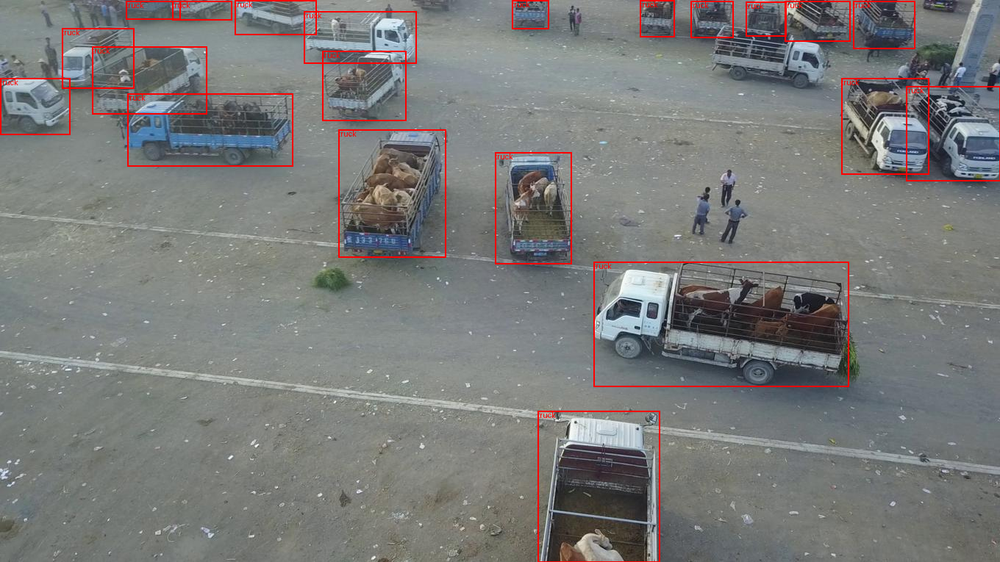

In [31]:
import io
from PIL import ImageDraw
# Fetch labels and image data for the selected image
labels = ds.labels[ind].data()['value']
image_data = ds.images[ind].tobytes()
bboxes = ds.boxes[ind].numpy()
ibox="truck" # class in image

# Display the image with bounding boxes for the label chosen
display_image_with_bboxes(image_data, bboxes, labels, label_name=ibox)

# Building a multimodal search engine

In [32]:
# The DataFrame is named 'df'
df['doc_id'] = df.index.astype(str)  # Create unique IDs from the row indices

# Create documents (extract relevant text for each image's labels)
documents = []
for _, row in df.iterrows():
    text_labels = row['labels'] # Each label is now a string
    text = " ".join(text_labels) # Join text labels into a single string
    document = Document(text=text, doc_id=row['doc_id'])
    documents.append(document)

In [33]:
from llama_index.core import VectorStoreIndex
vector_store_index = VectorStoreIndex.from_documents(documents)

In [34]:
vector_store_index.index_struct

IndexDict(index_id='82bab577-5595-44bc-a1c0-8d9a8ccc2176', summary=None, nodes_dict={'35a22c95-d7c7-4565-9f03-cd80c5a6f983': '35a22c95-d7c7-4565-9f03-cd80c5a6f983', 'f1058547-4424-4130-9844-d0dd78771cf2': 'f1058547-4424-4130-9844-d0dd78771cf2', 'a9b2dc12-e843-46c3-9665-7f98a5648bca': 'a9b2dc12-e843-46c3-9665-7f98a5648bca', '4b635901-3d70-4602-9e6b-a0d49c124b09': '4b635901-3d70-4602-9e6b-a0d49c124b09', '7d6505b2-cefc-4988-a3af-cc405106e018': '7d6505b2-cefc-4988-a3af-cc405106e018', '55c158de-3258-4760-b401-afc1146bc807': '55c158de-3258-4760-b401-afc1146bc807', '302340bb-48d8-47fc-860b-a46ea4a6d89e': '302340bb-48d8-47fc-860b-a46ea4a6d89e', '0d55cfc9-9809-43c7-922b-3b280b8565e1': '0d55cfc9-9809-43c7-922b-3b280b8565e1', '4fab77e0-2da1-4c28-8fb2-b518473fa83d': '4fab77e0-2da1-4c28-8fb2-b518473fa83d', '0ce1c888-7ab3-4f34-9545-7a665d19aa3b': '0ce1c888-7ab3-4f34-9545-7a665d19aa3b', '7ad1e618-922f-4094-a35c-875a340e3238': '7ad1e618-922f-4094-a35c-875a340e3238', 'de8f7d9e-a8c5-4579-aeba-2928427302

In [35]:
vector_query_engine = vector_store_index.as_query_engine(similarity_top_k=1, temperature=0.1, num_output=1024)

In [36]:
import time
start_time = time.time()
response = vector_query_engine.query(user_input)
# Stop the timer
end_time = time.time()
# Calculate and print the execution time
elapsed_time = end_time - start_time
print(f"Query execution time: {elapsed_time:.4f} seconds")

Query execution time: 1.5759 seconds


In [37]:
print(textwrap.fill(str(response), 100))

Drones can identify a truck through various methods such as visual recognition using cameras,
sensors, and artificial intelligence algorithms.


In [38]:
from itertools import groupby

def get_unique_words(text):
    text = text.lower().strip()
    words = text.split()
    unique_words = [word for word, _ in groupby(sorted(words))]
    return unique_words

for node in response.source_nodes:
    print(node.node_id)
    # Get unique words from the node text:
    node_text = node.get_text()
    unique_words = get_unique_words(node_text)
    print("Unique Words in Node Text:", unique_words)

26bebf29-218c-4722-929c-e45d3d045ded
Unique Words in Node Text: ['truck']


In [39]:
# deleting any image prevsiously saved
!rm /content/boxed_image.jpg

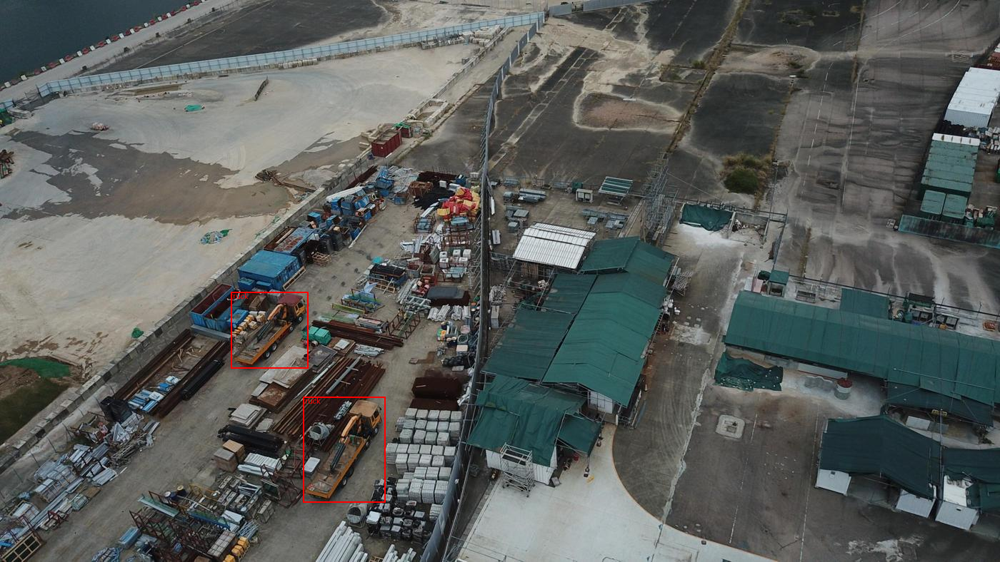

In [40]:
import io
from PIL import Image

def process_and_display(response, df, ds, unique_words):
    """Processes nodes, finds corresponding images in dataset, and displays them with bounding boxes.

    Args:
        response: The response object containing source nodes.
        df: The DataFrame with doc_id information.
        ds: The dataset containing images, labels, and boxes.
        unique_words: The list of unique words for filtering.
    """

    for i, sample in enumerate(ds):
        for node in response.source_nodes:
            related_node_info = next(iter(node.node.relationships.values()))
            original_doc_id = related_node_info.node_id

            try:
                row_index = df[df['doc_id'] == original_doc_id].index[0]
            except IndexError:
                continue  # Skip if doc_id not found in the DataFrame

            if i == row_index:
                image_bytes = io.BytesIO(sample.images.tobytes())
                img = Image.open(image_bytes)

                labels = ds.labels[i].data()['value']
                image_data = ds.images[i].tobytes()
                bboxes = ds.boxes[i].numpy()
                ibox = unique_words[0]  # class in image

                display_image_with_bboxes(image_data, bboxes, labels, label_name=ibox)

# Assuming you have your 'response', 'df', 'ds', and 'unique_words' objects prepared:
process_and_display(response, df, ds, unique_words)

# Multimodal Modular Summary

Assuming the processes have been activated.

In [41]:
from PIL import Image
def display_source_image(image_path):
  try:
    with Image.open(image_path) as img:
        display(img)
  except FileNotFoundError:
    print("Error: The image file was not found at the specified path.")
  except Exception as e:  # Catch other potential errors
    print(f"Error loading image: {e}")

How do drones identify a truck?
Drones can identify a truck through various methods such as using multisource remote sensing,
unmanned aerial vehicle (UAV) scanning technology, and data from unmanned aerial vehicles combined
with terrestrial laser scanning.


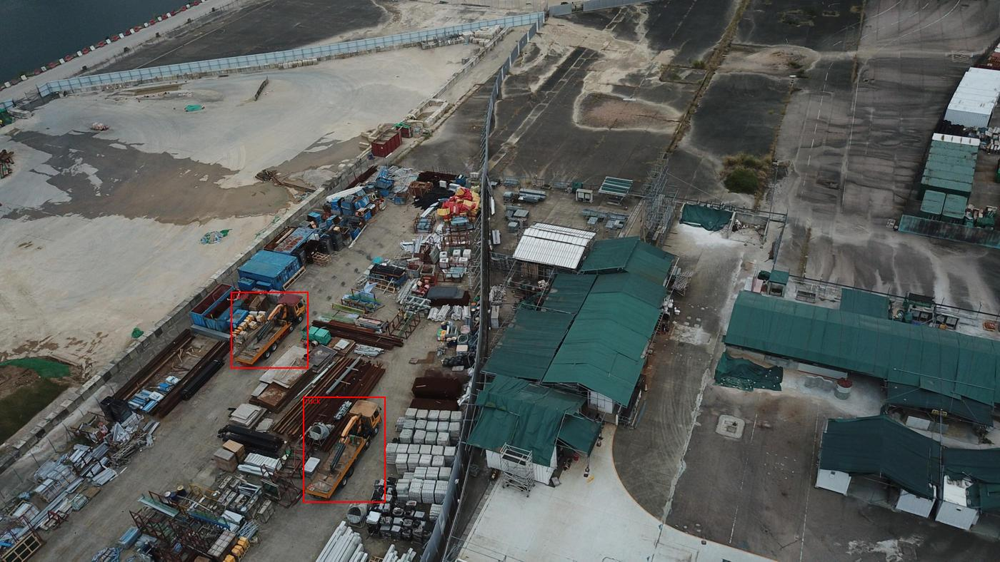

In [42]:
# 1.user input=user_input
print(user_input)
# 2.LLM response
print(textwrap.fill(str(llm_response), 100))
# 3.Multimodal reponse
image_path = "/content/boxed_image.jpg"
display_source_image(image_path)

# Performance metric

In [43]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [44]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')

def calculate_cosine_similarity_with_embeddings(text1, text2):
    embeddings1 = model.encode(text1)
    embeddings2 = model.encode(text2)
    similarity = cosine_similarity([embeddings1], [embeddings2])
    return similarity[0][0]

/usr/local/lib/python3.11/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## LLM performance

In [45]:
llm_similarity_score = calculate_cosine_similarity_with_embeddings(user_input, str(llm_response))
print(user_input)
print(llm_response)
print(f"Cosine Similarity Score: {llm_similarity_score:.3f}")

How do drones identify a truck?
Drones can identify a truck through various methods such as using multisource remote sensing, unmanned aerial vehicle (UAV) scanning technology, and data from unmanned aerial vehicles combined with terrestrial laser scanning.
Cosine Similarity Score: 0.827


## Multimodal performance

In [46]:
import base64

IMAGE_PATH = "/content/boxed_image.jpg"

# Open the image file and encode it as a base64 string
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

base64_image = encode_image(IMAGE_PATH)

In [47]:
from openai import OpenAI
#Set the API key for the client
client = OpenAI(api_key=openai.api_key)
MODEL="gpt-4o"

In [48]:
u_word=unique_words[0]
print(u_word)

truck


In [49]:
response = client.chat.completions.create(
    model=MODEL,
    messages=[
        {"role": "system", "content": f"You are a helpful assistant that analyzes images that contain {u_word}."},
        {"role": "user", "content": [
            {"type": "text", "text": f"Analyze the following image, tell me if there is one {u_word} or more in the bounding boxes and analyse them:"},
            {"type": "image_url", "image_url": {
                "url": f"data:image/png;base64,{base64_image}"}
            }
        ]}
    ],
    temperature=0.0,
)
response_image = response.choices[0].message.content
print(response_image)

The image shows two trucks within the red bounding boxes. Both trucks appear to be flatbed trucks, likely used for transporting materials. They are parked in an industrial or construction area, surrounded by various materials and equipment. The trucks seem to be loaded with items, possibly related to construction or logistics.


In [50]:
resp=user_input+u_word+"s"
multimodal_similarity_score = calculate_cosine_similarity_with_embeddings(resp, str(response_image))
print(f"Cosine Similarity Score: {multimodal_similarity_score:.3f}")

Cosine Similarity Score: 0.470


## Multimodal Modular RAG performance

In [51]:
score=(llm_similarity_score+multimodal_similarity_score)/2
print(f"Multimodal, Modular Score: {score:.3f}")

Multimodal, Modular Score: 0.649
